In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns
import pandas as pd
import requests
import tqdm
from time import sleep
from PIL import Image
from io import BytesIO
from adjustText import adjust_text
from pathlib import Path
import nba_api

from nba_api.stats.static.players import find_players_by_full_name
from nba_api.stats.static.teams import find_teams_by_full_name
from nba_api.stats.endpoints.playerdashptshotdefend import PlayerDashPtShotDefend
from nba_api.stats.endpoints.leaguedashplayerstats import LeagueDashPlayerStats
from nba_api.stats.endpoints.shotchartdetail import ShotChartDetail
from nba_api.stats.endpoints.leaguedashptstats import LeagueDashPtStats

In [2]:
drive_stats = LeagueDashPtStats(pt_measure_type='Drives', per_mode_simple='PerGame', season='2023-24', player_or_team='Player').get_data_frames()[0]

In [3]:
filtered_drives = drive_stats.loc[(drive_stats.GP > 7) & (drive_stats.MIN > 20)]

In [4]:
filtered_drives = filtered_drives.sort_values(by='DRIVES', ascending=False).iloc[:70]

In [5]:
plt.style.use('fivethirtyeight')

In [6]:
filtered_drives.loc[:, 'PSPD'] = filtered_drives.DRIVE_PTS / filtered_drives.DRIVES

In [8]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def getImage(path, zoom=1.0):
    #print(path)
    return OffsetImage(plt.imread(path), zoom=zoom)

from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.patches import Rectangle
from matplotlib.ticker import FormatStrFormatter


import matplotlib.ticker as mtick

zoom = 0.4
team_root_dir = '../../team_logos_id/'
player_root_dir = 'player_imgs/'

def get_player_img(player_id, should_download=False, zoom=zoom):
    path = Path(f'player_imgs/{player_id}.png').absolute()
    if not path.exists() and should_download:
        url = f"https://cdn.nba.com/headshots/nba/latest/260x190/{player_id}.png"
        response = requests.get(url)
        img = plt.imread(BytesIO(response.content))
        with open(f'player_imgs/{player_id}.png', 'wb') as f:
            f.write(response.content)
    else:
        img = plt.imread(f'{player_root_dir}{player_id}.png')
    #print(path)
    return OffsetImage(img, zoom=zoom)

def get_team_img(team_id):
    #print(path)
    return OffsetImage(plt.imread(f'{team_root_dir}{team_id}.png'), zoom=zoom)

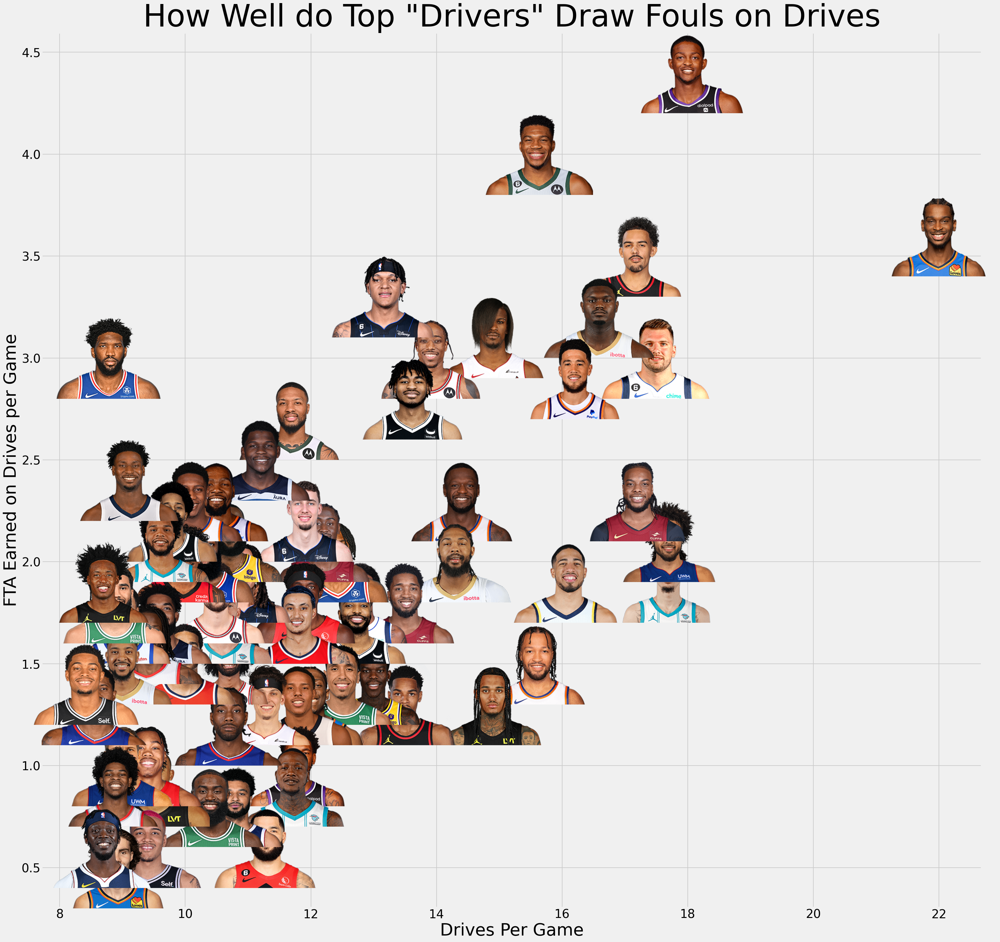

In [9]:
fig, ax = plt.subplots(figsize=(35, 35))

x=filtered_drives.DRIVES
y=filtered_drives.DRIVE_FTA
ax.scatter(x=x, y=y, s=100)

paths = []
for i in range(len(filtered_drives)):
    item = filtered_drives.iloc[i]
    get_player_img(player_id=item.PLAYER_ID, should_download=True)
    paths.append(f'player_imgs/{item.PLAYER_ID}.png')

for x0, y0, path in zip(x.tolist(), y.tolist(), paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

ax.tick_params(labelsize=28)
ax.set_xlabel("Drives Per Game", size=40)
ax.set_ylabel("FTA Earned on Drives per Game", size=40)
ax.set_title('How Well do Top "Drivers" Draw Fouls on Drives', size=72)


ax.grid(True, lw=1.5)

In [25]:
top_drives = filtered_drives.sort_values(by='DRIVES', ascending=False).iloc[:70]

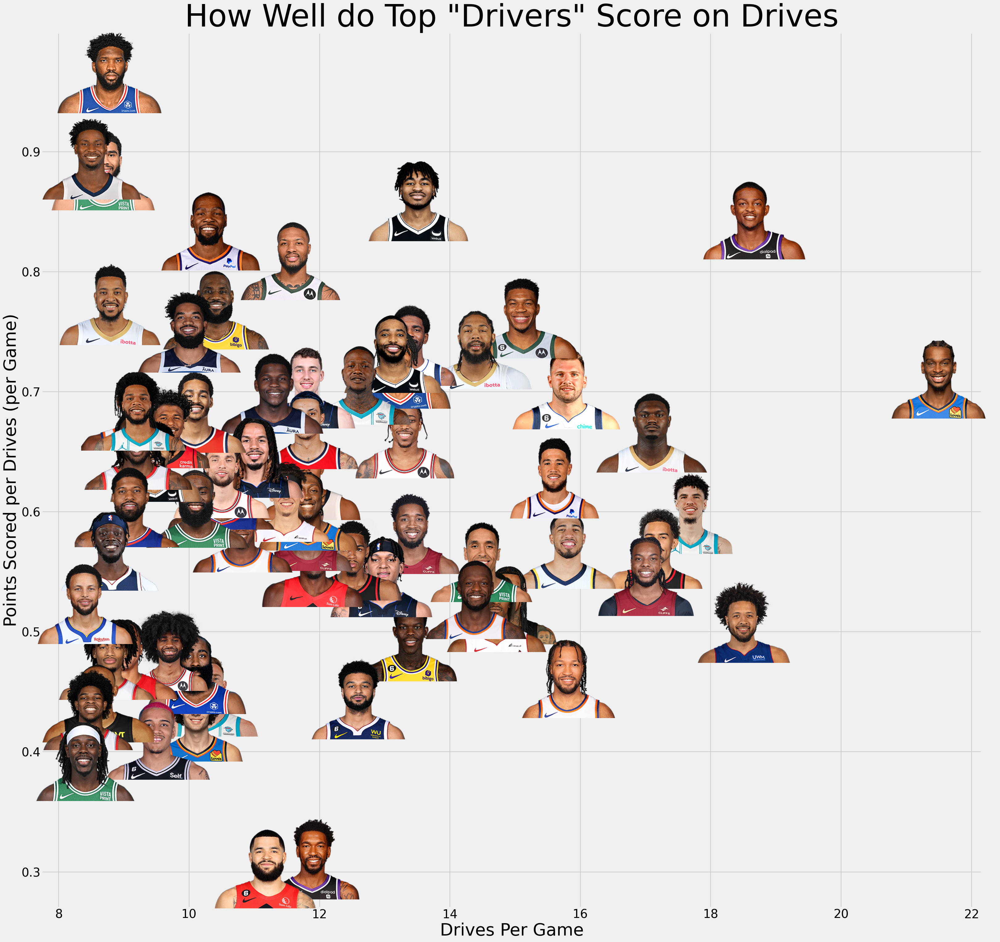

In [26]:
fig, ax = plt.subplots(figsize=(35, 35))

x=top_drives.DRIVES
y=top_drives.PSPD
ax.scatter(x=x, y=y, s=100)

paths = []
for i in range(len(top_drives)):
    item = top_drives.iloc[i]
    get_player_img(player_id=item.PLAYER_ID, should_download=True)
    paths.append(f'player_imgs/{item.PLAYER_ID}.png')

for x0, y0, path in zip(x.tolist(), y.tolist(), paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

ax.tick_params(labelsize=28)
ax.set_xlabel("Drives Per Game", size=40)
ax.set_ylabel("Points Scored per Drives (per Game)", size=40)
ax.set_title('How Well do Top "Drivers" Score on Drives', size=72)


ax.grid(True, lw=1.5)